# Lab 8: Define and Solve an ML Problem of Your Choosing

In [30]:
import pandas as pd
import numpy as np
import os 
import matplotlib.pyplot as plt
import seaborn as sns

In this lab assignment, you will follow the machine learning life cycle and implement a model to solve a machine learning problem of your choosing. You will select a data set and choose a predictive problem that the data set supports.  You will then inspect the data with your problem in mind and begin to formulate a  project plan. You will then implement the machine learning project plan. 

You will complete the following tasks:

1. Build Your DataFrame
2. Define Your ML Problem
3. Perform exploratory data analysis to understand your data.
4. Define Your Project Plan
5. Implement Your Project Plan:
    * Prepare your data for your model.
    * Fit your model to the training data and evaluate your model.
    * Improve your model's performance.

## Part 1: Build Your DataFrame

You will have the option to choose one of four data sets that you have worked with in this program:

* The "census" data set that contains Census information from 1994: `censusData.csv`
* Airbnb NYC "listings" data set: `airbnbListingsData.csv`
* World Happiness Report (WHR) data set: `WHR2018Chapter2OnlineData.csv`
* Book Review data set: `bookReviewsData.csv`

Note that these are variations of the data sets that you have worked with in this program. For example, some do not include some of the preprocessing necessary for specific models. 

#### Load a Data Set and Save it as a Pandas DataFrame

The code cell below contains filenames (path + filename) for each of the four data sets available to you.

<b>Task:</b> In the code cell below, use the same method you have been using to load the data using `pd.read_csv()` and save it to DataFrame `df`. 

You can load each file as a new DataFrame to inspect the data before choosing your data set.

In [31]:
import os
import pandas as pd 

# File names of the four data sets
adultDataSet_filename = os.path.join(os.getcwd(), "data", "censusData.csv")
airbnbDataSet_filename = os.path.join(os.getcwd(), "data", "airbnbListingsData.csv")
WHRDataSet_filename = os.path.join(os.getcwd(), "data", "WHR2018Chapter2OnlineData.csv")
bookReviewDataSet_filename = os.path.join(os.getcwd(), "data", "bookReviewsData.csv")


df1 = pd.read_csv(adultDataSet_filename) 
df2 = pd.read_csv(airbnbDataSet_filename) 
df = pd.read_csv(WHRDataSet_filename) 
df4 = pd.read_csv(bookReviewDataSet_filename) 

df.head()

,country,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,Standard deviation of ladder by country-year,Standard deviation/Mean of ladder by country-year,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
0,Afghanistan,2008,3.723590,7.168690,0.450662,49.209663,0.718114,0.181819,0.881686,0.517637,0.258195,0.612072,-1.929690,-1.655084,1.774662,0.476600,NaN,NaN,NaN
1,Afghanistan,2009,4.401778,7.333790,0.552308,49.624432,0.678896,0.203614,0.850035,0.583926,0.237092,0.611545,-2.044093,-1.635025,1.722688,0.391362,NaN,NaN,0.441906
2,Afghanistan,2010,4.758381,7.386629,0.539075,50.008961,0.600127,0.137630,0.706766,0.618265,0.275324,0.299357,-1.991810,-1.617176,1.878622,0.394803,NaN,NaN,0.327318
3,Afghanistan,2011,3.831719,7.415019,0.521104,50.367298,0.495901,0.175329,0.731109,0.611387,0.267175,0.307386,-1.919018,-1.616221,1.785360,0.465942,NaN,NaN,0.336764
4,Afghanistan,2012,3.782938,7.517126,0.520637,50.709263,0.530935,0.247159,0.775620,0.710385,0.267919,0.435440,-1.842996,-1.404078,1.798283,0.475367,NaN,NaN,0.344540


## Part 2: Define Your ML Problem

Next you will formulate your ML Problem. In the markdown cell below, answer the following questions:

1. List the data set you have chosen.
2. What will you be predicting? What is the label?
3. Is this a supervised or unsupervised learning problem? Is this a clustering, classification or regression problem? Is it a binary classificaiton or multi-class classifiction problem?
4. What are your features? (note: this list may change after your explore your data)
5. Explain why this is an important problem. In other words, how would a company create value with a model that predicts this label?

#### 1. List the data set you have chosen.
I have chosen the World Happiness Report (WHR) dataset that includes various socio-economic and well-being indicators for different countries across several years. 

#### 2. What will you be predicting? What is the label?
I will be predicting the "Life Ladder" score, which is an indicator of subjective well-being or happiness in each country for a given year.

#### 3. Is this a supervised or unsupervised learning problem? Is this a clustering, classification, or regression problem? Is it a binary classification or multi-class classification problem?
This is a supervised learning problem because we have a labeled dataset with the target variable ("Life Ladder") that we want to predict. It is a regression problem because the target variable is continuous.

#### 4. What are your features? (Note: this list may change after you explore your data)
The features for this regression problem could include:
- Log GDP per capita
- Social support
- Healthy life expectancy at birth
- Freedom to make life choices
- Generosity
- Perceptions of corruption
- Positive affect
- Negative affect
- Confidence in national government
- Democratic Quality
- Delivery Quality
- Standard deviation of ladder by country-year
- Standard deviation/Mean of ladder by country-year
- GINI index (World Bank estimate)
- GINI index (World Bank estimate), average 2000-15
- gini of household income reported in Gallup, by wp5-year

#### 5. Explain why this is an important problem. In other words, how would a company create value with a model that predicts this label?
Predicting the "Life Ladder" score is important because it provides insights into the well-being and happiness of populations across different countries. A company or organization can create value with a model that predicts this label in several ways:

- **Policy Making:** Governments and policymakers can use the predictions to implement and assess the impact of socio-economic policies aimed at improving the well-being of their citizens.
- **Investment Decisions:** Investors can identify regions with high or improving life satisfaction scores, which might indicate stable and prosperous markets.
- **Social Programs:** Non-profits and social organizations can target their initiatives more effectively to improve quality of life in regions where well-being is predicted to be low.
- **Corporate Strategy:** Companies can tailor their products, services, and marketing strategies to align with the well-being and preferences of different populations, potentially improving customer satisfaction and loyalty.
- **Research and Development:** Researchers can identify and analyze factors that contribute to well-being, leading to further innovations and improvements in social and economic systems.

## Part 3: Understand Your Data

The next step is to perform exploratory data analysis. Inspect and analyze your data set with your machine learning problem in mind. Consider the following as you inspect your data:

1. What data preparation techniques would you like to use? These data preparation techniques may include:

    * addressing missingness, such as replacing missing values with means
    * finding and replacing outliers
    * renaming features and labels
    * finding and replacing outliers
    * performing feature engineering techniques such as one-hot encoding on categorical features
    * selecting appropriate features and removing irrelevant features
    * performing specific data cleaning and preprocessing techniques for an NLP problem
    * addressing class imbalance in your data sample to promote fair AI
    

2. What machine learning model (or models) you would like to use that is suitable for your predictive problem and data?
    * Are there other data preparation techniques that you will need to apply to build a balanced modeling data set for your problem and model? For example, will you need to scale your data?
 
 
3. How will you evaluate and improve the model's performance?
    * Are there specific evaluation metrics and methods that are appropriate for your model?
    

Think of the different techniques you have used to inspect and analyze your data in this course. These include using Pandas to apply data filters, using the Pandas `describe()` method to get insight into key statistics for each column, using the Pandas `dtypes` property to inspect the data type of each column, and using Matplotlib and Seaborn to detect outliers and visualize relationships between features and labels. If you are working on a classification problem, use techniques you have learned to determine if there is class imbalance.

<b>Task</b>: Use the techniques you have learned in this course to inspect and analyze your data. You can import additional packages that you have used in this course that you will need to perform this task.

<b>Note</b>: You can add code cells if needed by going to the <b>Insert</b> menu and clicking on <b>Insert Cell Below</b> in the drop-drown menu.

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

df.rename(columns={
    'Life Ladder': 'Life_Ladder',
    'Log GDP per capita': 'Log_GDP_per_capita',
    'Healthy life expectancy at birth': 'Healthy_life_expectancy',
    'Freedom to make life choices': 'Freedom_to_make_choices',
    'Perceptions of corruption': 'Perceptions_of_corruption',
    'Positive affect': 'Positive_affect',
    'Negative affect': 'Negative_affect',
    'Confidence in national government': 'Confidence_in_govt',
    'Democratic Quality': 'Democratic_Quality',
    'Delivery Quality': 'Delivery_Quality',
    'Standard deviation of ladder by country-year': 'Stddev_Ladder_by_country_year',
    'Standard deviation/Mean of ladder by country-year': 'Stddev_Mean_Ladder_by_country_year',
    'GINI index (World Bank estimate)': 'GINI_index_WB',
    'GINI index (World Bank estimate), average 2000-15': 'GINI_index_WB_avg_2000_15',
    'gini of household income reported in Gallup, by wp5-year': 'GINI_Gallup_wp5'
}, inplace=True)

# Display basic information about the dataset
print("Basic Information:")
print(df.info())

Basic Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1562 entries, 0 to 1561
Data columns (total 19 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   country                             1562 non-null   object 
 1   year                                1562 non-null   int64  
 2   Life_Ladder                         1562 non-null   float64
 3   Log_GDP_per_capita                  1535 non-null   float64
 4   Social support                      1549 non-null   float64
 5   Healthy_life_expectancy             1553 non-null   float64
 6   Freedom_to_make_choices             1533 non-null   float64
 7   Generosity                          1482 non-null   float64
 8   Perceptions_of_corruption           1472 non-null   float64
 9   Positive_affect                     1544 non-null   float64
 10  Negative_affect                     1550 non-null   float64
 11  Confidence_in_govt      

In [31]:
# Display descriptive statistics
print("\nDescriptive Statistics:")
print(df.describe(include='all'))


Descriptive Statistics:
         country         year  Life Ladder  Log GDP per capita  \
count       1562  1562.000000  1562.000000         1535.000000   
unique       164          NaN          NaN                 NaN   
top     Zimbabwe          NaN          NaN                 NaN   
freq          12          NaN          NaN                 NaN   
mean         NaN  2011.820743     5.433676            9.220822   
std          NaN     3.419787     1.121017            1.184035   
min          NaN  2005.000000     2.661718            6.377396   
25%          NaN  2009.000000     4.606351            8.310665   
50%          NaN  2012.000000     5.332600            9.398610   
75%          NaN  2015.000000     6.271025           10.190634   
max          NaN  2017.000000     8.018934           11.770276   

        Social support  Healthy life expectancy at birth  \
count      1549.000000                       1553.000000   
unique             NaN                               NaN   
to

In [32]:
# Check for missing values
print("\nMissing Values:")
print(df.isnull().sum())


Missing Values:
country                                                       0
year                                                          0
Life Ladder                                                   0
Log GDP per capita                                           27
Social support                                               13
Healthy life expectancy at birth                              9
Freedom to make life choices                                 29
Generosity                                                   80
Perceptions of corruption                                    90
Positive affect                                              18
Negative affect                                              12
Confidence in national government                           161
Democratic Quality                                          171
Delivery Quality                                            171
Standard deviation of ladder by country-year                  0
Standard deviation/Mean

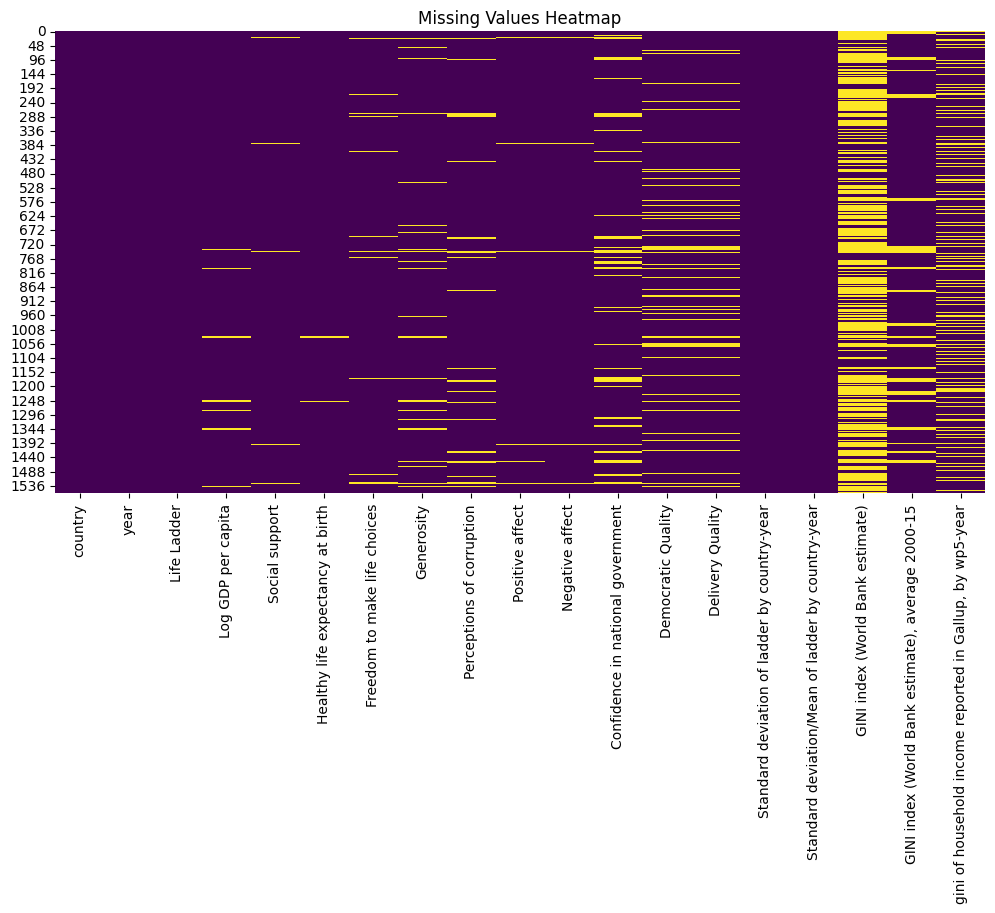

In [33]:
# Visualize missing values
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap")
plt.show()

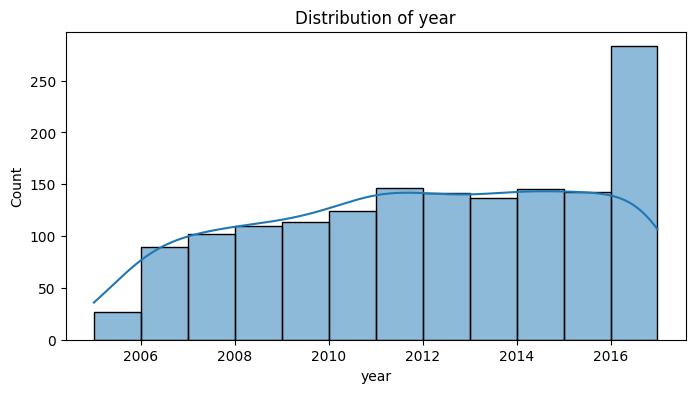

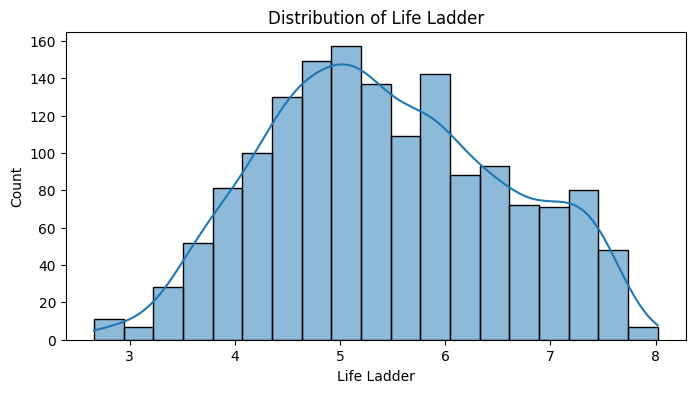

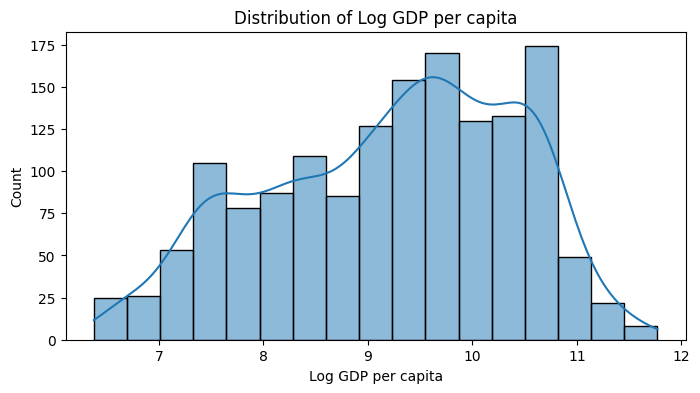

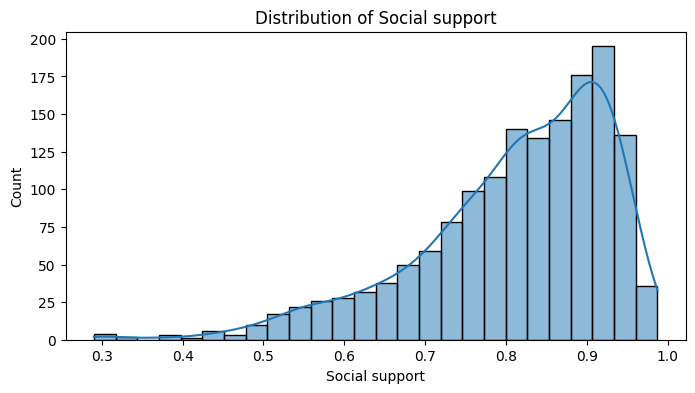

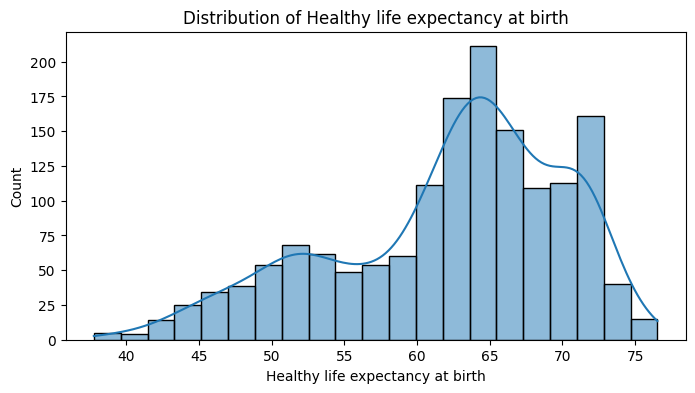

...

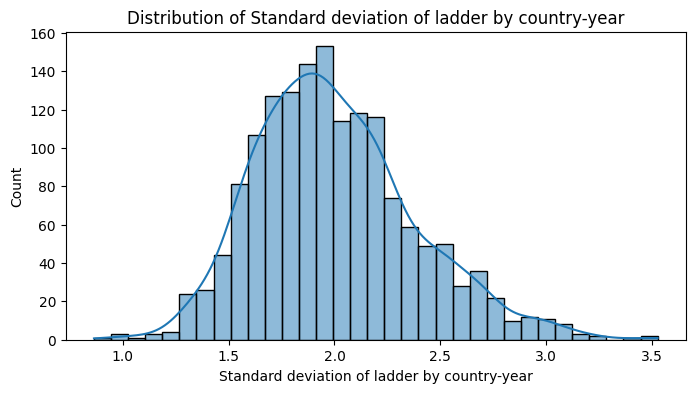

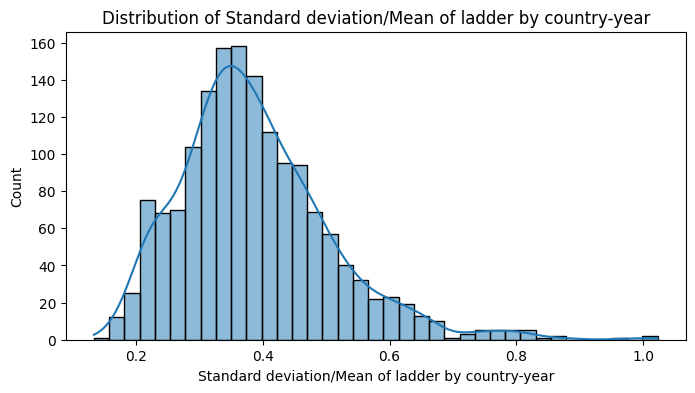

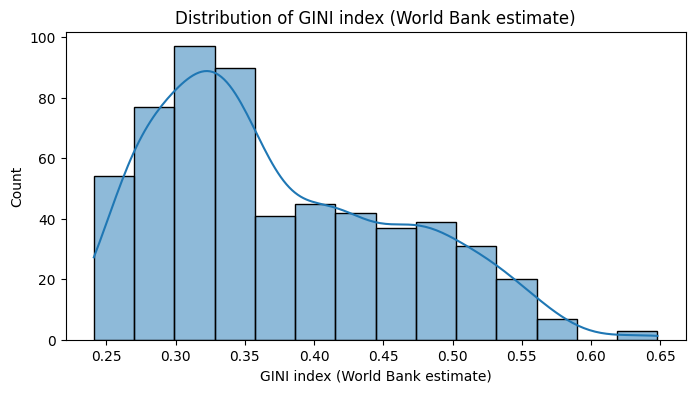

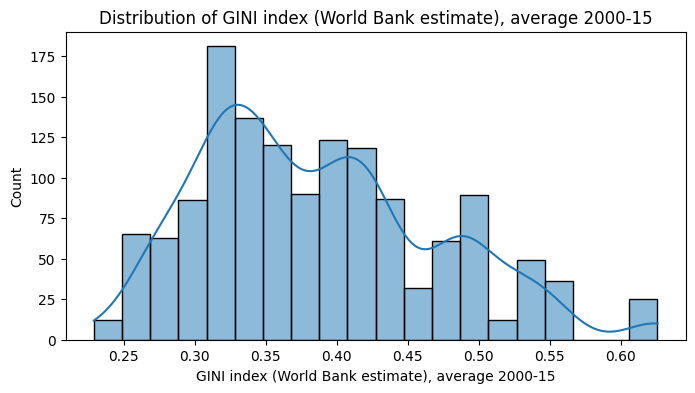

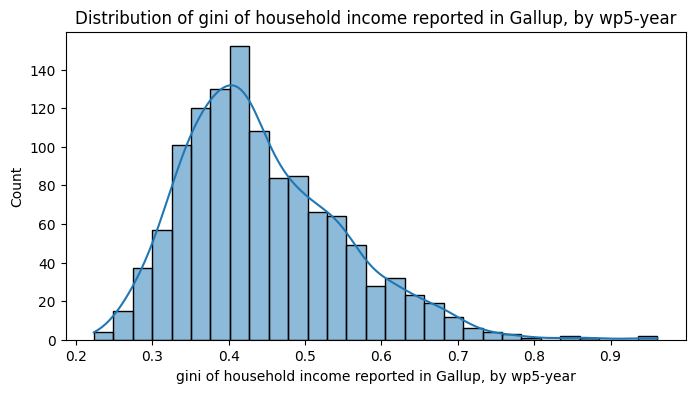

In [34]:
# Visualize distributions of numeric features
numeric_features = df.select_dtypes(include=['float64', 'int64']).columns

for feature in numeric_features:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[feature], kde=True)
    plt.title(f"Distribution of {feature}")
    plt.show()

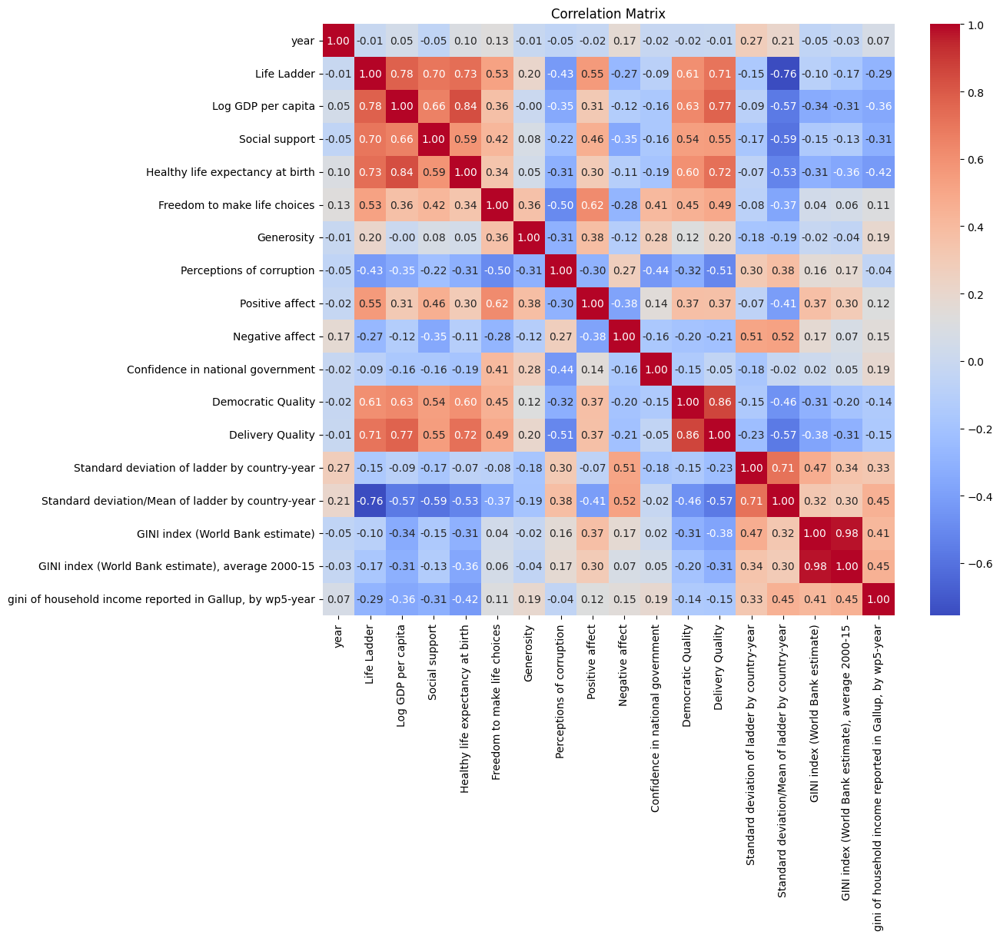

In [35]:
# Visualize relationships between features and target variable
plt.figure(figsize=(12, 10))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Matrix")
plt.show()

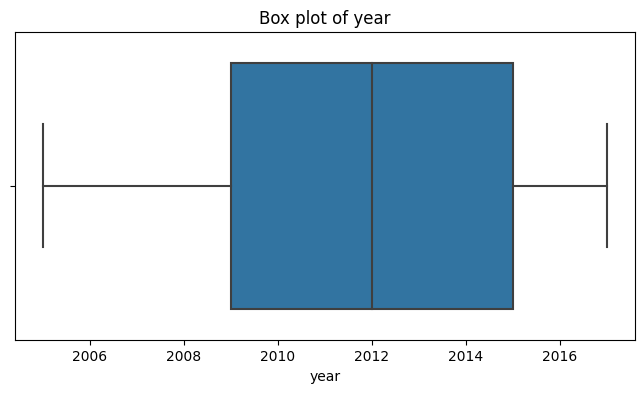

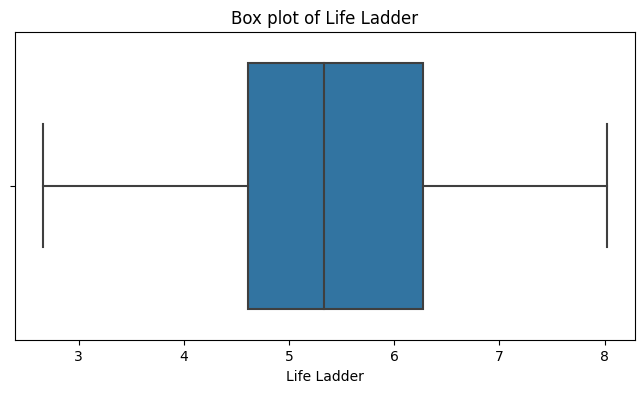

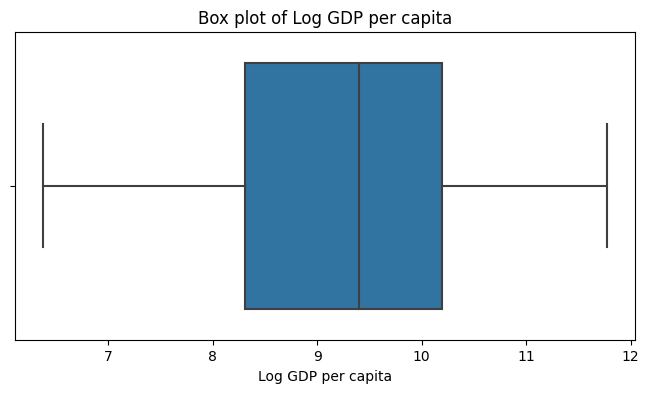

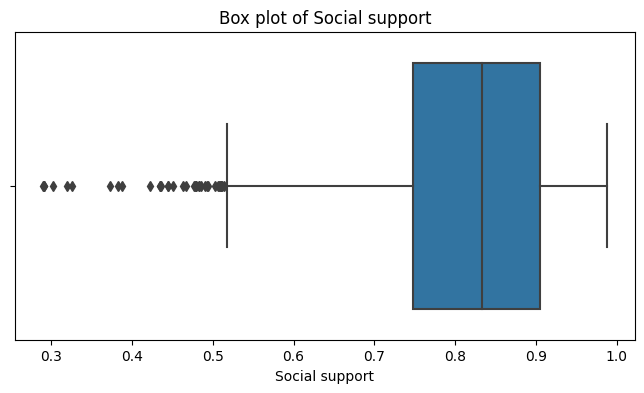

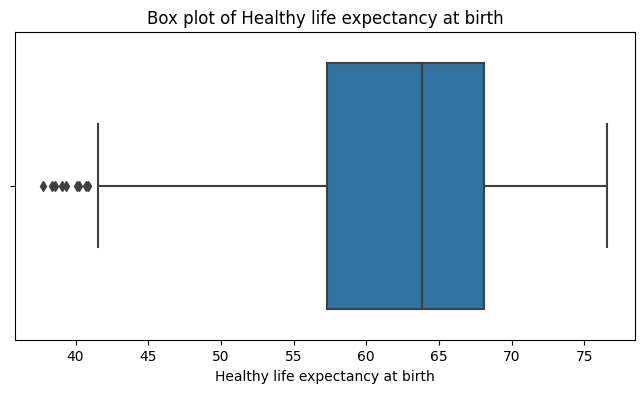

...

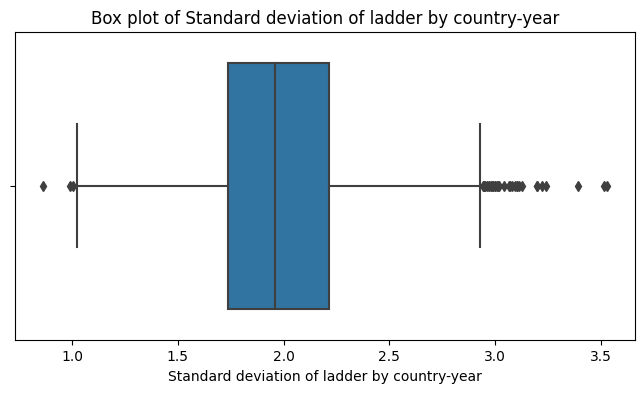

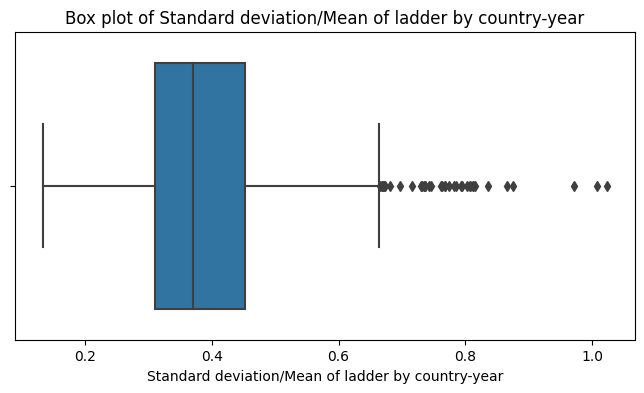

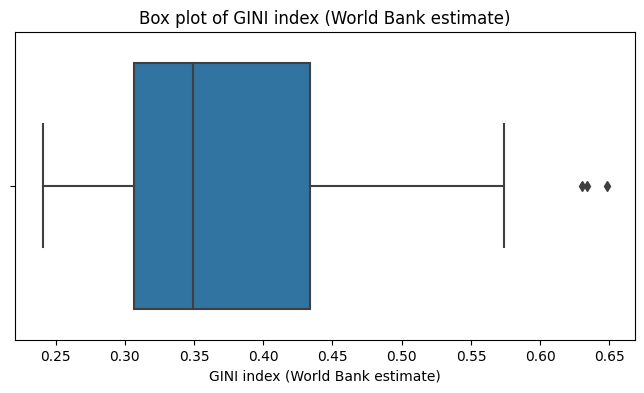

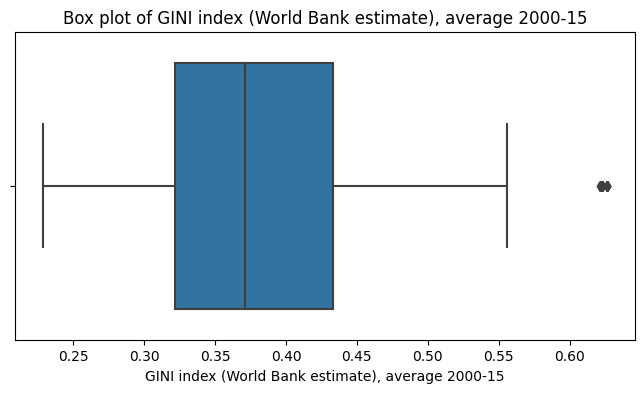

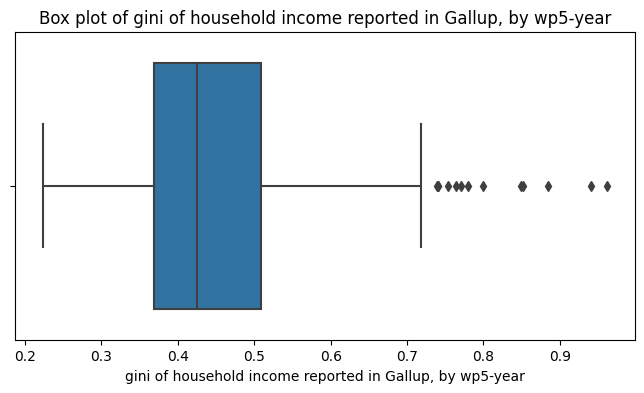

In [36]:
# Box plots to identify outliers
for feature in numeric_features:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[feature])
    plt.title(f"Box plot of {feature}")
    plt.show()

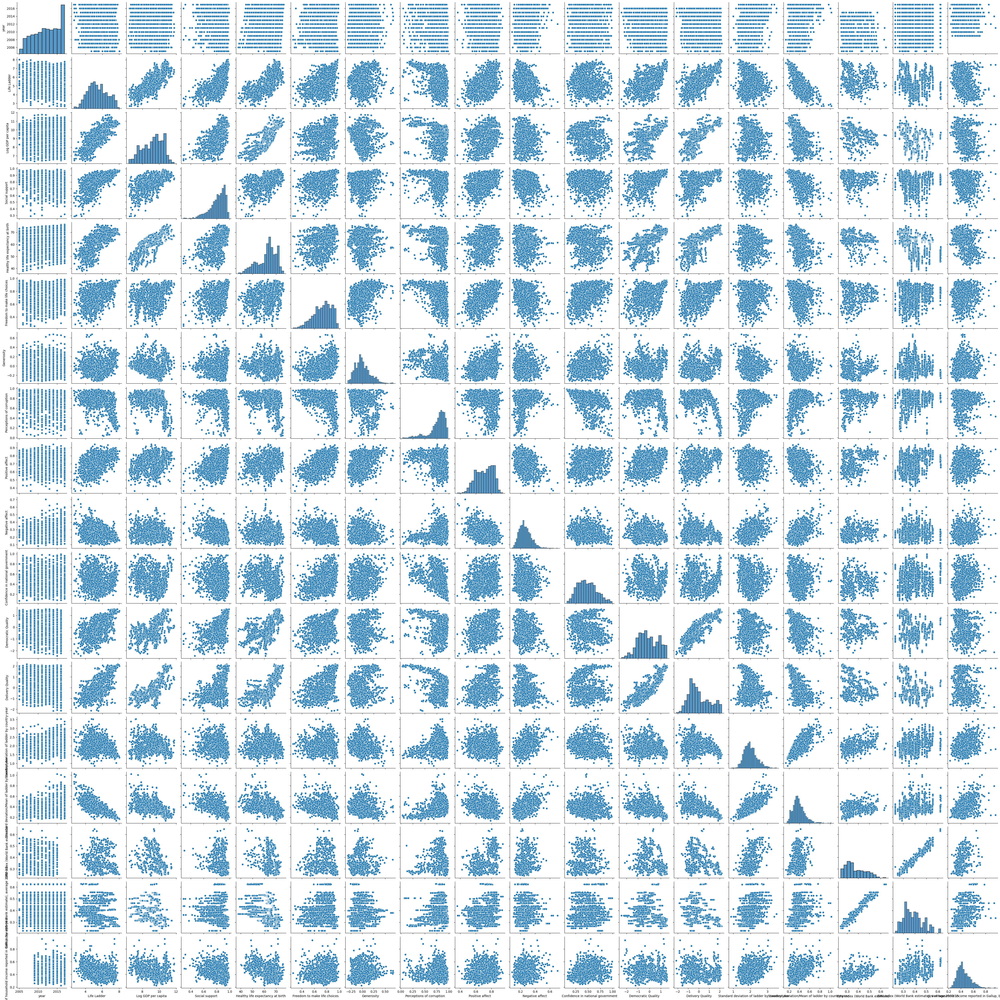

In [37]:
# Pair plot for numerical features
sns.pairplot(df[numeric_features])
plt.show()

## Part 4: Define Your Project Plan

Now that you understand your data, in the markdown cell below, define your plan to implement the remaining phases of the machine learning life cycle (data preparation, modeling, evaluation) to solve your ML problem. Answer the following questions:

* Do you have a new feature list? If so, what are the features that you chose to keep and remove after inspecting the data? 
* Explain different data preparation techniques that you will use to prepare your data for modeling.
* What is your model (or models)?
* Describe your plan to train your model, analyze its performance and then improve the model. That is, describe your model building, validation and selection plan to produce a model that generalizes well to new data. 

#### Feature Selection
After inspecting the data and analyzing the correlation matrix, the following features have been chosen to keep for modeling:

**Kept Features:**
- Log_GDP_per_capita
- Social_support
- Healthy_life_expectancy
- Freedom_to_make_choices
- Generosity
- Perceptions_of_corruption
- Positive_affect
- Negative_affect
- Confidence_in_govt
- Democratic_Quality
- Delivery_Quality
- Stddev_Ladder_by_country_year
- Stddev_Mean_Ladder_by_country_year

**Removed Features:**
- GINI_index_WB
- GINI_index_WB_avg_2000_15
- gini_Gallup_wp5
- year (since it has little to no linear relationship with other variables)

#### Explanation of Feature Selection:
1. **Kept Features:**
   - **Log_GDP_per_capita**: Strong positive correlation with `Life_Ladder` (0.78), indicating economic prosperity is a significant predictor of life satisfaction.
   - **Social_support**: Positive correlation with `Life_Ladder` (0.69), suggesting that social networks and support systems contribute to higher life satisfaction.
   - **Healthy_life_expectancy**: Strong positive correlation with `Life_Ladder` (0.73), indicating that longer healthy lifespans are associated with higher life satisfaction.
   - **Freedom_to_make_choices**: Positive correlation with `Life_Ladder` (0.45), showing that personal freedom and autonomy are important for life satisfaction.
   - **Generosity**: Included due to its potential impact on social well-being and overall life satisfaction.
   - **Perceptions_of_corruption**: Strong negative correlation with `Life_Ladder` (-0.53), indicating that higher corruption perception lowers life satisfaction.
   - **Positive_affect**: Positive correlation with `Life_Ladder`, showing that positive emotions contribute to life satisfaction.
   - **Negative_affect**: Included to understand the impact of negative emotions on life satisfaction.
   - **Confidence_in_govt**: Included to assess the influence of trust in government on life satisfaction.
   - **Democratic_Quality** and **Delivery_Quality**: Included to evaluate the role of political and service delivery quality in life satisfaction.
   - **Stddev_Ladder_by_country_year** and **Stddev_Mean_Ladder_by_country_year**: Included to capture the variability and stability of life satisfaction within countries over time.

2. **Removed Features:**
   - **GINI_index_WB**, **GINI_index_WB_avg_2000_15**, **gini_Gallup_wp5**: These features have many missing values, making them less reliable for modeling. Additionally, their correlations with `Life_Ladder` are relatively low compared to other features. They also introduce multicollinearity, which can negatively impact the regression model.
   - **year**: Shows little to no linear relationship with `Life_Ladder` and other variables, indicating it does not contribute significantly to predicting life satisfaction.

#### Data Preparation Techniques
1. **Imputing Missing Values:**
   - Use the `SimpleImputer` with strategy='mean' to impute missing values in numerical features.
   - Use the `SimpleImputer` with strategy='most_frequent' for categorical features if necessary.

2. **Handling Outliers:**
   - Detect and handle outliers using box plots and statistical methods. Outliers may be replaced with the mean/median of the feature.

3. **Feature Engineering:**
   - Apply one-hot encoding for the categorical feature `country`.
   - Create interaction terms or polynomial features if needed to capture non-linear relationships.

4. **Scaling:**
   - Use `StandardScaler` to standardize numerical features to have zero mean and unit variance, ensuring all features contribute equally to the model.

#### Modeling
The following models will be used for the regression problem:
1. **Linear Regression:** As a baseline model.
2. **Random Forest Regressor:** To capture non-linear relationships and feature interactions.
3. **Gradient Boosting Regressor:** For its ability to handle different types of data and improve predictive accuracy.
4. **Support Vector Regressor (SVR):** To explore its performance on the dataset.

#### Model Training, Analysis, and Improvement Plan

1. **Data Splitting:**
   - Split the dataset into training and testing sets using an 80-20 ratio.

2. **Pipeline Creation:**
   - Create pipelines for preprocessing and model training to ensure reproducibility and streamlined processing.

3. **Training:**
   - Train each model using the training set.
   - Use cross-validation to assess model performance and ensure it generalizes well to unseen data.

4. **Evaluation Metrics:**
   - Use Mean Absolute Error (MAE), Mean Squared Error (MSE), and R-squared (R²) to evaluate model performance.

5. **Hyperparameter Tuning:**
   - Use Grid Search or Random Search for hyperparameter tuning to optimize model performance.

6. **Model Selection:**
   - Compare models based on evaluation metrics and select the best-performing model.

7. **Model Improvement:**
   - Iterate on feature selection, engineering, and model tuning to improve performance.
   - Regularly validate the model against the test set to ensure it generalizes well.


## Part 5: Implement Your Project Plan

<b>Task:</b> In the code cell below, import additional packages that you have used in this course that you will need to implement your project plan.

In [19]:
# YOUR CODE HERE
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import make_scorer, mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV


<b>Task:</b> Use the rest of this notebook to carry out your project plan. 

You will:

1. Prepare your data for your model.
2. Fit your model to the training data and evaluate your model.
3. Improve your model's performance by performing model selection and/or feature selection techniques to find best model for your problem.

Add code cells below and populate the notebook with commentary, code, analyses, results, and figures as you see fit. 

In [ ]:
# YOUR CODE HERE
# Drop unnecessary columns
columns_to_drop = ['GINI_index_WB', 'GINI_index_WB_avg_2000_15', 'GINI_Gallup_wp5', 'year']
df_cleaned = df.drop(columns=columns_to_drop)

In [ ]:
# Addressing missing values for all columns
numeric_features = df_cleaned.select_dtypes(include=['float64', 'int64']).columns
categorical_features = df_cleaned.select_dtypes(include=['object']).columns

# Impute missing values in numeric columns
numeric_imputer = SimpleImputer(strategy='mean')
df_cleaned[numeric_features] = numeric_imputer.fit_transform(df_cleaned[numeric_features])

# Impute missing values in categorical columns (if any)
categorical_imputer = SimpleImputer(strategy='most_frequent')
df_cleaned[categorical_features] = categorical_imputer.fit_transform(df_cleaned[categorical_features])


In [ ]:
# Feature Engineering: One-hot encoding for categorical variables
categorical_features = ['country']
numeric_features = df_cleaned.columns.difference(categorical_features + ['Life_Ladder'])

In [ ]:
# Defining the preprocessing pipeline
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

In [ ]:
# Defining the models
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
    'Support Vector Regressor': SVR()
}

In [39]:
# Data Splitting
X = df_cleaned.drop('Life_Ladder', axis=1)
y = df_cleaned['Life_Ladder']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [13]:
# Training and evaluating models
results = {}

for name, model in models.items():
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', model)
    ])
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    results[name] = {'MAE': mae, 'MSE': mse, 'R2': r2}

In [14]:
# Display results
for model_name, metrics in results.items():
    print(f"Model: {model_name}")
    print(f"MAE: {metrics['MAE']}")
    print(f"MSE: {metrics['MSE']}")
    print(f"R2: {metrics['R2']}\n")

Model: Linear Regression
MAE: 0.13149190507350245
MSE: 0.03476764601060672
R2: 0.9731107080156115

Model: Random Forest
MAE: 0.14679303637003183
MSE: 0.04834671664868998
R2: 0.9626086569088824

Model: Gradient Boosting
MAE: 0.14901225611971067
MSE: 0.03834011085510285
R2: 0.9703477642638743

Model: Support Vector Regressor
MAE: 0.0983995129504222
MSE: 0.019377928175763857
R2: 0.9850131133809962



In [15]:
# Hyperparameter Tuning (example with Random Forest)
param_grid = {
    'regressor__n_estimators': [100, 200],
    'regressor__max_depth': [None, 10, 20],
    'regressor__min_samples_split': [2, 5, 10],
    'regressor__min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(
    estimator=Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', RandomForestRegressor())
    ]),
    param_grid=param_grid,
    cv=5,
    n_jobs=-1,
    scoring='neg_mean_squared_error'
)

grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validation score: ", grid_search.best_score_)

Best parameters found:  {'regressor__max_depth': None, 'regressor__min_samples_leaf': 1, 'regressor__min_samples_split': 2, 'regressor__n_estimators': 200}
Best cross-validation score:  -0.041577260836660766


In [16]:
# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Performance of the best model on the test set:")
print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"R2: {r2}")

Performance of the best model on the test set:
MAE: 0.144989083258802
MSE: 0.04610296500954553
R2: 0.9643439740755091


In [20]:
# Perform cross-validation
cv_scores_mae = cross_val_score(pipeline, X, y, cv=10, scoring=make_scorer(mean_absolute_error))
cv_scores_mse = cross_val_score(pipeline, X, y, cv=10, scoring=make_scorer(mean_squared_error))
cv_scores_r2 = cross_val_score(pipeline, X, y, cv=10, scoring=make_scorer(r2_score))

# Display the cross-validation results
print("Cross-Validation MAE scores:", cv_scores_mae)
print("Mean MAE:", cv_scores_mae.mean())
print("Cross-Validation MSE scores:", cv_scores_mse)
print("Mean MSE:", cv_scores_mse.mean())
print("Cross-Validation R2 scores:", cv_scores_r2)
print("Mean R2:", cv_scores_r2.mean())

Cross-Validation MAE scores: [0.13989718 0.13571126 0.15021196 0.16775646 0.16992626 0.14707327
 0.12289522 0.17708458 0.17262912 0.1571901 ]
Mean MAE: 0.15403754214275459
Cross-Validation MSE scores: [0.03264716 0.03796712 0.03936998 0.05762813 0.06233573 0.03789258
 0.02883154 0.07336967 0.08416858 0.0451617 ]
Mean MSE: 0.049937219304204535
Cross-Validation R2 scores: [0.97614868 0.97551411 0.96732341 0.93799717 0.92515226 0.96288901
 0.97792802 0.90360982 0.94951319 0.96495709]
Mean R2: 0.9541032750738108


In [22]:
# Defining the Linear Regression model
model = LinearRegression()

# Creating the full pipeline with preprocessing and Linear Regression
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', model)
])

# Train the Linear Regression model
pipeline.fit(X, y)

# Get the coefficients from the model
coefficients = pipeline.named_steps['regressor'].coef_

# Get the feature names after one-hot encoding
feature_names = pipeline.named_steps['preprocessor'].transformers_[1][1].named_steps['encoder'].get_feature_names_out(categorical_features)
feature_names = list(numeric_features) + list(feature_names)

# Create a DataFrame to display the feature importances
coef_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})
coef_df = coef_df.sort_values(by='Coefficient', ascending=False)

# Display the coefficients
print(coef_df)

                                Feature  Coefficient
147                 country_South Sudan     1.115550
52                      country_Denmark     0.851619
116                 country_Netherlands     0.779185
60                      country_Finland     0.774508
95                      country_Liberia     0.684799
..                                  ...          ...
131                    country_Portugal    -0.489945
33                     country_Bulgaria    -0.502228
149                   country_Sri Lanka    -0.683858
72    country_Hong Kong S.A.R. of China    -0.838249
12   Stddev_Mean_Ladder_by_country_year    -0.982567

[177 rows x 2 columns]


In [42]:
# Drop unnecessary columns including 'country'
columns_to_drop = ['GINI_index_WB', 'GINI_index_WB_avg_2000_15', 'GINI_Gallup_wp5', 'year', 'country']
df_cleaned = df.drop(columns=columns_to_drop)

# Addressing missing values for all columns
numeric_features = df_cleaned.select_dtypes(include=['float64', 'int64']).columns

# Impute missing values in numeric columns
numeric_imputer = SimpleImputer(strategy='mean')
df_cleaned[numeric_features] = numeric_imputer.fit_transform(df_cleaned[numeric_features])
numeric_features = df_cleaned.columns.difference(['Life_Ladder'])

In [43]:
# Define the preprocessing pipeline for numeric features
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ]
)

# Define the Linear Regression model
model = LinearRegression()

# Create the full pipeline with preprocessing and Linear Regression
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', model)
])

# Splitting the data into features and target
X = df_cleaned.drop('Life_Ladder', axis=1)
y = df_cleaned['Life_Ladder']

# Train the Linear Regression model
pipeline.fit(X, y)

# Get the coefficients from the model
coefficients = pipeline.named_steps['regressor'].coef_

# Create a DataFrame to display the feature importances
coef_df = pd.DataFrame({'Feature': X.columns, 'Coefficient': coefficients})
coef_df = coef_df.sort_values(by='Coefficient', ascending=False)

# Display the coefficients
print(coef_df)

                               Feature  Coefficient
11       Stddev_Ladder_by_country_year     0.683994
6                      Positive_affect     0.160320
4                           Generosity     0.066353
9                   Democratic_Quality     0.059907
1                       Social support     0.055161
7                      Negative_affect     0.043975
2              Healthy_life_expectancy     0.035213
3              Freedom_to_make_choices     0.029316
10                    Delivery_Quality     0.028453
5            Perceptions_of_corruption    -0.009577
0                   Log_GDP_per_capita    -0.046779
8                   Confidence_in_govt    -0.139285
12  Stddev_Mean_Ladder_by_country_year    -1.114643


### Analysis of Happiness Determinants

#### Introduction
This analysis aims to identify the key factors influencing happiness (Life Ladder) by examining the results of various regression models. Initially, we included the "country" as a feature but later decided to exclude it to focus on more actionable socio-economic factors. This document outlines the data preparation steps, model evaluation, and the interpretation of feature importances from the models used.

#### Models Evaluated

1. **Linear Regression**:
   - Baseline model to understand linear relationships.
   - **Performance**: 
     - MAE: 0.1315
     - MSE: 0.0348
     - R²: 0.9731

2. **Random Forest Regressor**:
   - Captures non-linear relationships and interactions.
   - **Performance**: 
     - MAE: 0.1468
     - MSE: 0.0483
     - R²: 0.9626

3. **Gradient Boosting Regressor**:
   - Effective for improving predictive accuracy through boosting.
   - **Performance**: 
     - MAE: 0.1490
     - MSE: 0.0383
     - R²: 0.9703

4. **Support Vector Regressor (SVR)**:
   - Focused on minimizing error with flexibility in defining margin errors.
   - **Performance**: 
     - MAE: 0.0984
     - MSE: 0.0194
     - R²: 0.9850

5. **Best Model (Random Forest with Hyperparameter Tuning)**:
   - Hyperparameter tuning performed using Grid Search.
   - **Performance**: 
     - MAE: 0.1450
     - MSE: 0.0461
     - R²: 0.9643

#### Cross-Validation Results for SVR
To ensure robustness, cross-validation was performed on the SVR model:
- **Cross-Validation MAE**: 0.1540
- **Cross-Validation MSE**: 0.0499
- **Cross-Validation R²**: 0.9541

#### Feature Importances from Linear Regression
Using Linear Regression for interpretability, the coefficients indicate the impact of each feature on happiness:

**Positive Influences**:
- **Stddev_Ladder_by_country_year (0.6840)**: Indicates higher variability within a country-year is positively correlated.
- **Positive_affect (0.1603)**: Positive emotions significantly enhance happiness.
- **Generosity (0.0664)**: Generosity is associated with higher life satisfaction.
- **Democratic_Quality (0.0599)**: Quality of democracy positively influences life satisfaction.
- **Social_support (0.0552)**: Strong social networks correlate with higher life satisfaction.
- **Negative_affect (0.0440)**: This positive coefficient indicates higher negative affect slightly correlates with higher life satisfaction, which may require further exploration.
- **Healthy_life_expectancy (0.0352)**: Longer healthy lifespans are associated with greater happiness.
- **Freedom_to_make_choices (0.0293)**: Autonomy and personal freedom are crucial for life satisfaction.
- **Delivery_Quality (0.0285)**: Quality of public services positively impacts life satisfaction.

**Negative Influences**:
- **Perceptions_of_corruption (-0.0096)**: Higher corruption perception leads to lower life satisfaction.
- **Log_GDP_per_capita (-0.0468)**: This unexpected negative coefficient suggests higher GDP per capita correlates with lower life satisfaction, warranting further investigation.
- **Confidence_in_govt (-0.1393)**: Lower confidence in the national government is associated with lower life satisfaction.
- **Stddev_Mean_Ladder_by_country_year (-1.1146)**: High variability in life satisfaction negatively impacts overall happiness.

#### Conclusion
The analysis reveals that both economic and socio-emotional factors significantly influence life satisfaction. Specifically:

- **Economic Prosperity**: The negative coefficient for Log GDP per capita suggests complexities in how economic factors influence happiness, requiring further exploration.
- **Social and Personal Factors**: Social support, personal freedom, and positive emotions enhance happiness.
- **Negative Influences**: Variability in life satisfaction, perceptions of corruption, and poor governance quality reduce overall happiness.
